<a href="https://colab.research.google.com/github/lizhieffe/RL_practicing/blob/main/RL_Deep_RL_(DQN%2C_REINFORCE%2C_Actor_Critic).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DQN

Deep Q-Network
- Solved Atari games

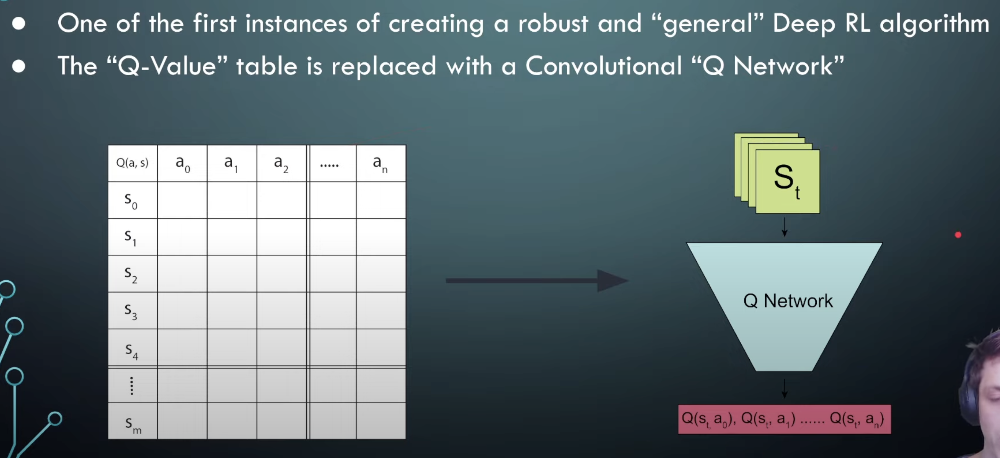

Instead of updating a tabular Q-table (action value table), DQN uses loss to update the Q-network.

In the screenshot below
- the y is target
- The Q-network in the 2nd equation is usually fronzen (delay trained) to improve numerical stability

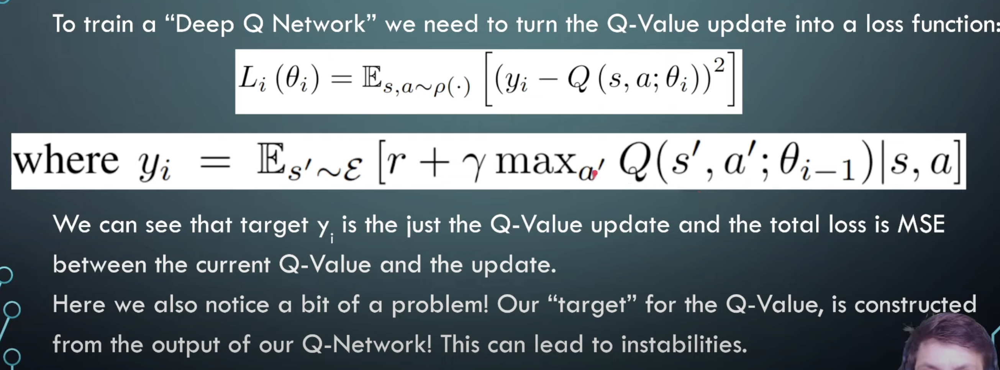

## Code

In [2]:
import math
import random

import gym
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Normal, Categorical
from IPython.display import clear_output
import matplotlib.pyplot as plt

from collections import deque

In [2]:
env_name = 'CartPole-v0'
env = gym.make(env_name)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns 

In [3]:
class QNet(nn.Module):
  def __init__(self, action_num=2, hidden_size=256):
    super(QNet, self).__init__()
    self.fc1 = nn.Linear(4, hidden_size)
    self.fc2 = nn.Linear(hidden_size, action_num)

  def forward(self, x):
    x = F.relu(self.fc1(x))
    q_values = self.fc2(x)
    return q_values

In [4]:
# @title Replay buffer lib

class ReplayBuffer:
  def __init__(self,
               data_names: list[str],
               buffer_size: int,
               mini_batch_size: int):
    """
    Initialization.

    Args:
      data_names: the names of data. Each name is stored separately.
      buffer_size: the max buffer size to store each name.
      mini_batch_size: the size of each mini-batch.
    """
    self.data_keys = data_names

    # Each key in the dict has the same size of data.
    self.data_dict = {}

    self.buffer_size = buffer_size
    self.mini_batch_size = mini_batch_size

    self.reset()

  def reset(self) -> None:
    for name in self.data_keys:
      self.data_dict[name] = deque(maxlen=self.buffer_size)

  def buffer_full(self) -> bool:
    return len(self.data_dict[self.data_keys[0]]) == self.buffer_size

  def data_log(self, data_name: str, data: torch.FloatTensor) -> None:
    """Log the data.

    Args:
      data_name: the name of the data.
      data: the data to log.
    """
    # Split tensor along batch into a list of individual Tensors
    data_split = data.cpu().split(1)

    # deque will handle spitting data exceeding the buffer size.
    self.data_dict[data_name].extend(data_split)

  def __iter__(self):
    """Randomly sample a batch of data from buffer."""

    batch_size = len(self.data_dict[self.data_keys[0]])
    # TODO: name "batch_size" is misleading. It is the total number of data we draw from the buffer.
    # batch_size % self.mini_batch_size is the residule of (batch_size/mini_batch_size)
    batch_size = batch_size -  batch_size % self.mini_batch_size

    # Get a random permutation of the int in [0, batch_size)
    ids = np.random.permutation(batch_size)

    # Split the ids into groups with each group size is mini_batch_size.
    # batch_size // self.mini_batch_size is the "quotient". e.g. 9 // 4 == 2
    ids = np.split(ids, batch_size // self.mini_batch_size)

    for i in range(len(ids)):
      batch_dict = {}
      for name in self.data_keys:
        # print(f"===lizhi {ids[i]=}")
        # print(f"===lizhi {self.data_dict[name]=}")
        c = [self.data_dict[name][j] for j in ids[i]]
        batch_dict[name] = torch.cat(c)
      batch_dict['batch_size'] = len(ids[i])
      yield batch_dict

  def __len__(self):
    return len(self.data_dict[self.data_keys[0]])

In [5]:
def test_agent(q_net: QNet) -> float:
  """Run one rollout for the agent in the given env.

  Args:
    q_net: the agent QNet.

  Returns:
    The total reward.
  """
  done = False
  total_reward = 0.0
  observation = torch.FloatTensor(env.reset()).unsqueeze(0)

  with torch.no_grad():
    while not done:
      q_value = q_net(observation)
      action = q_value.argmax().cpu().item()

      observation, reward, done, info = env.step(action)
      del info

      observation = torch.FloatTensor(observation).unsqueeze(0)

      total_reward += reward

  return total_reward

In [6]:
def dqn_update(q_net: QNet, replay_buffer: ReplayBuffer, gamma: float, optimizer: optim.Optimizer) -> None:
  """Train DQN using all data in the replay buffer.

  Args:
    q_net: the DQN to train
    replay_buffer: the replay buffer containing the sampled state transitions.
    gamma: the reward decay factor.
    optimizer: the optimizer to use for training.
  """
  for data_batch in replay_buffer:
    rewards = data_batch['rewards']
    states = data_batch['states']
    actions = data_batch['actions']
    next_states = data_batch['next_states']
    # 1 means the next_states is not terminal; 0 means terminal.
    masks = data_batch['masks']

    # detach() is to disable gradient on anchor.
    next_q_values = q_net(next_states).detach()  # B
    next_q_values_max = next_q_values.max(dim=1)[0].unsqueeze(1) # B
    # print(f"{next_q_values.max(dim=1)=}")
    # print(f"{next_q_values.max(dim=1)[0]=}")
    # print(f"{next_q_values.max(dim=1)[0].unsqueeze(1)=}")
    # assert False
    y = rewards + gamma * next_q_values_max * masks

    q_values = q_net(states)
    # print(f"{q_values=}")
    # print(f"{actions=}")
    q_values_for_actions = q_values.gather(1, actions)

    q_loss = (y - q_values_for_actions).pow(2).mean()

    optimizer.zero_grad()
    q_loss.backward()
    optimizer.step()

In [7]:
lr = 1e-2
gamma = 0.99
buffer_size = 2000
mini_batch_size = 32

# Max rollout stpes to sample.
max_steps = 15000

decay_steps = 15000

data_names = ["states", "next_states", "actions", "rewards", "masks"]

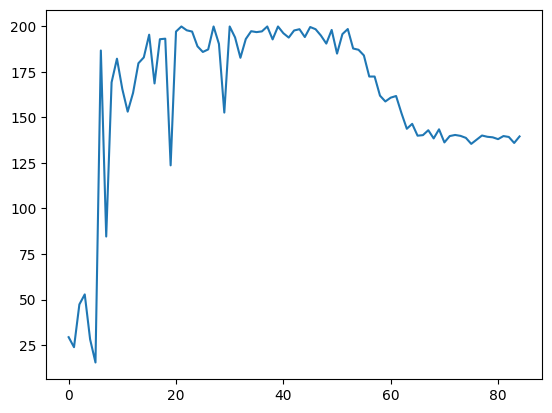

In [8]:
# Num of sampled trajectories
rollouts = 0

# Num of steps in env. It sums over all trajectories.
steps = 0

# Used in the Epsilon-Greedy
initial_epsilon = 1
epsilon = initial_epsilon

score_logger = []

q_net = QNet()
optimizer = optim.Adam(q_net.parameters(), lr=lr)

replay_buffer = ReplayBuffer(data_names, buffer_size, mini_batch_size)
steps_per_rollout_log = []

while steps < max_steps:
  done = False
  observation = torch.FloatTensor(env.reset()).unsqueeze(0)

  states_log = []
  actions_log = []
  rewards_log = []
  masks_log = []

  steps_per_rollout = 0

  while not done:
    states_log.append(observation)

    q_value = q_net(observation)

    if random.random() > epsilon:
      action = q_value.argmax().reshape(-1, 1)
    else:
      action = torch.LongTensor([env.action_space.sample()]).reshape(-1, 1)
    actions_log.append(action)

    observation, reward, done, info = env.step(action.cpu().item())
    del info

    observation = torch.FloatTensor(observation).unsqueeze(0)

    rewards_log.append(torch.FloatTensor([reward]).unsqueeze(0))
    masks_log.append(torch.FloatTensor([1 - done]).unsqueeze(0))

    steps += 1
    steps_per_rollout += 1

  steps_per_rollout_log.append(steps_per_rollout)

  states_log.append(observation)

  replay_buffer.data_log('states', torch.cat(states_log[:-1]))
  replay_buffer.data_log('next_states', torch.cat(states_log[1:]))
  replay_buffer.data_log('actions', torch.cat(actions_log))
  replay_buffer.data_log('rewards', torch.cat(rewards_log))
  replay_buffer.data_log('masks', torch.cat(masks_log))

  if replay_buffer.buffer_full():
    dqn_update(q_net, replay_buffer, gamma, optimizer)

    # Update the LR and Epsilon
    if rollouts % 2 == 0:
      # Gradually reduce LR and Epsilon until arriving a min value.
      new_lr = max(1e-4, ((decay_steps - steps) / decay_steps) * lr)
      epsilon = max(0.2, ((decay_steps - steps) / decay_steps) * initial_epsilon)
      optimizer.param_groups[0]["lr"] = new_lr

      # Sample
      score_logger.append(np.mean([test_agent(q_net) for _ in range(10)]))
      clear_output(True)
      plt.plot(score_logger)
      plt.show()

  rollouts += 1

env.close()

In [9]:
print(f"{rollouts=}, {np.mean(steps_per_rollout_log)=}")

rollouts=268, np.mean(steps_per_rollout_log)=55.98880597014925


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Policy Gradient

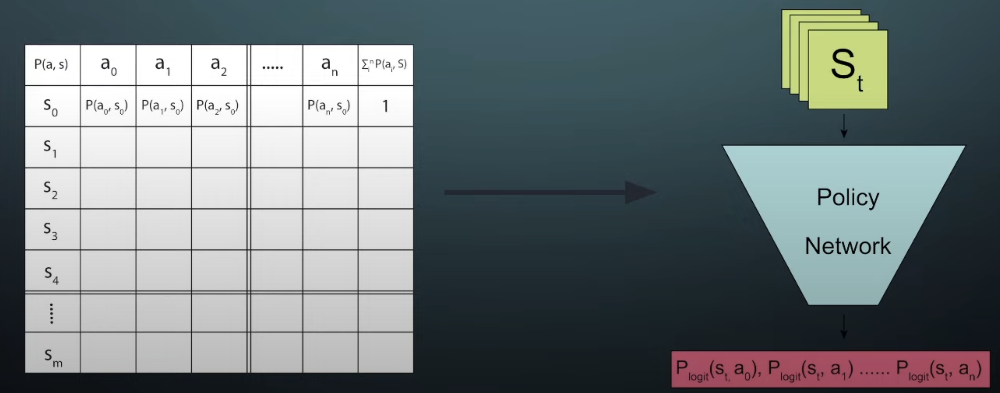

## **REINFORCE** loss function

- In the image below, pay attention that "the loss is the expectation over the **current** policy". If a trajectory is from an older version of the policy, it is **NOT** helpful.

- Unlike DQN, we **don't need a replay buffer** as policy gradient methods are not as sensitive to non-stationary data (we don't learn a Q-Value). Part of the reason is that, REINFORCE directly learn the policy, in contrast DQN learns the Q values which is more like a bootstrap and thus needs more data to train.

- The replay buffer used in DQN contains trajectories which might be used multiple times; they don't reflect the latest model's behavior.

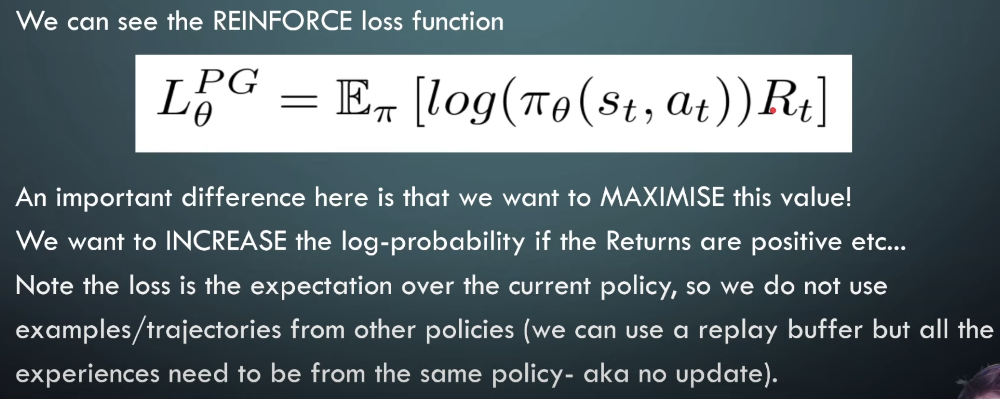

## Code

In [10]:
env_name = 'CartPole-v0'
env = gym.make(env_name)

/usr/local/lib/python3.10/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


In [10]:
def calc_returns(rewards: list[float], gamma):
  returns = []
  R = 0
  for reward in reversed(rewards):
    R = R * gamma + reward
    returns.insert(0, R)
  return returns

In [12]:
class RL(nn.Module):
  """Policy network."""

  def __init__(self, action_num=2, hidden_size=256):
    super(RL, self).__init__()
    self.fc1 = nn.Linear(4, hidden_size)
    self.fc2 = nn.Linear(hidden_size, action_num)

  def forward(self, x):
    """Forward pass.

    Args:
      x: the input args.

    Returns:
      The prob distribution of the categories.
    """
    x = F.relu(self.fc1(x))
    logits = self.fc2(x)

    # Categorical distribution
    # See https://pytorch.org/docs/stable/distributions.html
    return Categorical(logits = logits)

In [3]:
def test_agent(policy_network: RL):
  """Run one rollout for the agent in the given env.

  Args:
    q_net: the agent QNet.

  Returns:
    The total reward.
  """
  done = False
  total_rewards = 0
  observation = torch.FloatTensor(env.reset()).unsqueeze(0)

  while not done:
    dist = policy_network(observation)
    action = dist.sample().cpu().item()

    observation, reward, done, info = env.step(action)
    del info

    total_rewards += reward
    observation = torch.FloatTensor(observation).unsqueeze(0)
    # loss = -m.log_prob(action) * reward
    # loss.backward()

  return total_rewards

NameError: name 'RL' is not defined

In [14]:
policy_model = RL()
lr = 1e-3

gamma = 0.99
mini_batch_size = 32

# Max rollout stpes to sample.
max_steps = 100_000
# max_steps = 10_000

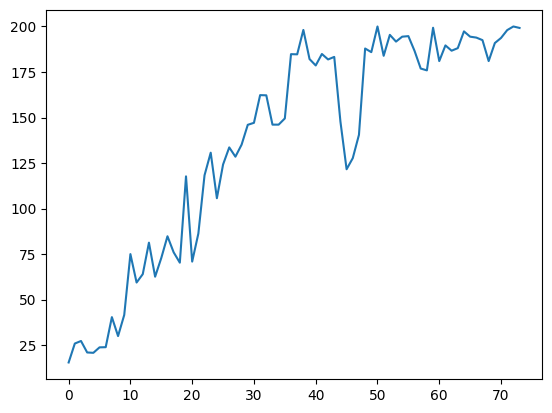

In [15]:
# from tqdm import tqdm
from tqdm.notebook import tqdm

optimizer = optim.Adam(policy_model.parameters(), lr=lr)

steps = 0

pbar = tqdm(total=max_steps)

score_logger = []

while steps < max_steps:
  rewards_log = []
  states_log = []
  log_probs_log = []

  done = False
  observation = torch.FloatTensor(env.reset()).unsqueeze(0)

  while not done:

    states_log.append(observation)

    dist = policy_model(observation)
    action = dist.sample()

    log_prob = dist.log_prob(action.unsqueeze(0))
    log_probs_log.append(log_prob)

    observation, reward, done, info = env.step(action.cpu().item())
    del info

    observation = torch.FloatTensor(observation).unsqueeze(0)

    reward = torch.FloatTensor([reward]).unsqueeze(0)
    rewards_log.append(reward)

    steps += 1
    pbar.update(1)

  states_log.append(observation)

  returns_log = calc_returns(rewards_log, gamma)
  # Input: A list of N tensors whose shapes are (1,1)
  # Convert the list to a single tensor of (1, N)
  returns = torch.cat(returns_log, 1)
  returns = returns / returns.max()

  log_probs = torch.cat(log_probs_log, 1)

  action_loss = - (log_probs * returns).sum()

  optimizer.zero_grad()
  action_loss.backward()
  optimizer.step()

  if rollouts % 10 == 0:
    new_lr = max(1e-5, ((max_steps - steps) / max_steps) * lr)
    optimizer.param_groups[0]["lr"] = new_lr

    score_logger.append(np.mean([test_agent(policy_model) for _ in range(10)]))
    clear_output(True)
    plt.plot(score_logger)
    plt.show()


  rollouts += 1

  pbar.clear()

In [16]:
np.mean([test_agent(policy_model) for _ in range(100)])

185.25

# Actor-Critic

- Actor means the **policy** model, Critic means the model to predict **value**.

- For the Policy Gradient method (e.g. REINFORCE), the return used in the loss is noisy (high variance). The Actor-Critic instead uses a critic to predict the value, which is biased by less noisy.

- Policy gradient: low bias, high variance

- Actor-Critic: high bias, low variance

- Practically, mostly of time we use a **single, combined** Actor/Critic Network, with different heads.

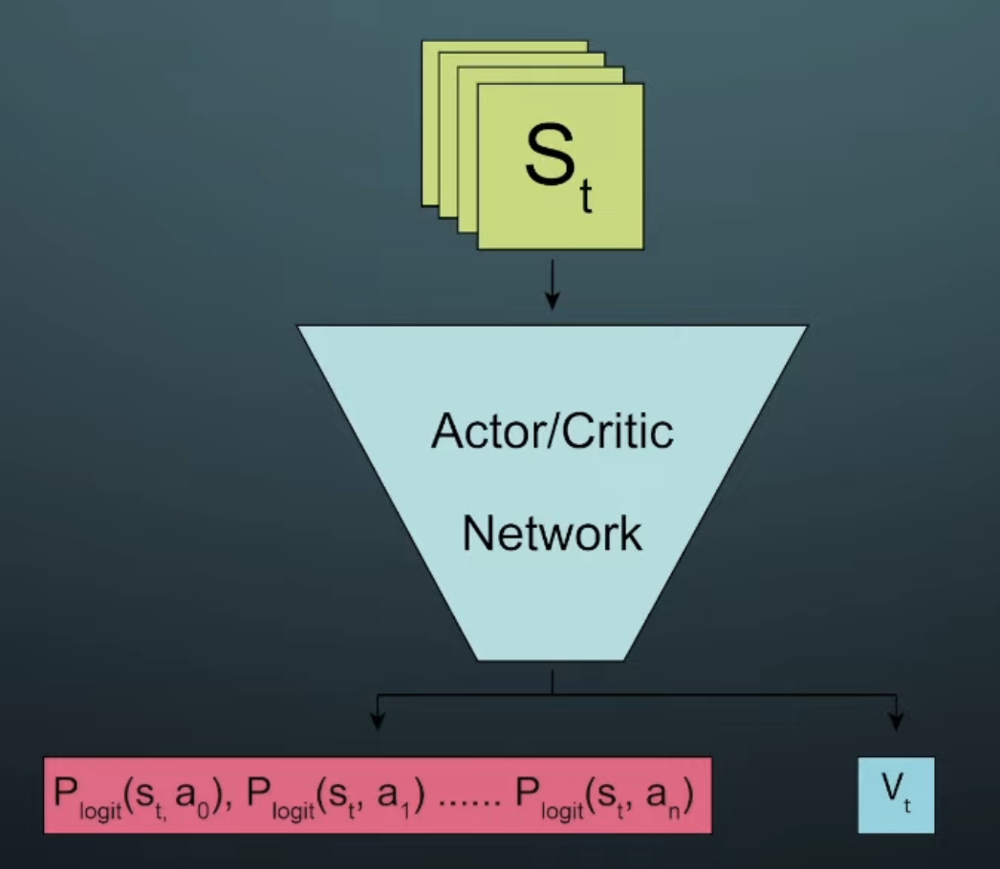

## Loss function

Similar as REINFORCE, except we not calculate the **Advantage**.

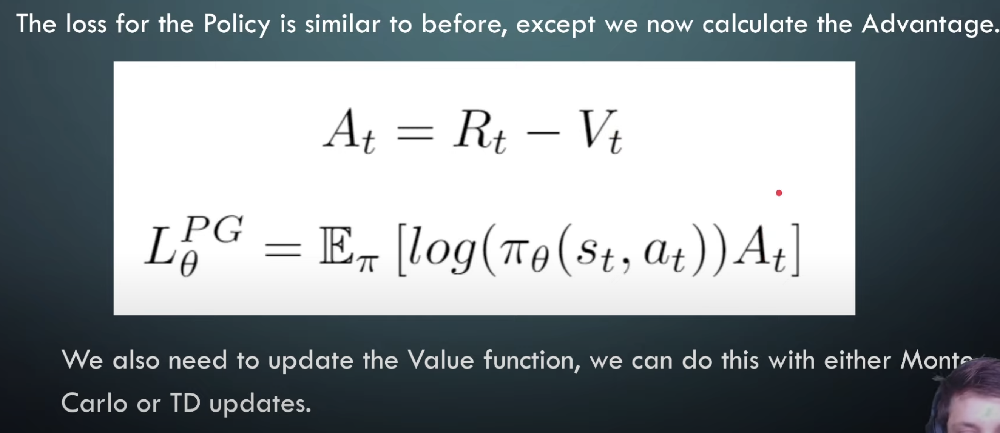

## Code

In [4]:
env_name = 'CartPole-v0'
env = gym.make(env_name)

/usr/local/lib/python3.10/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


In [5]:
class RL(nn.Module):
  """Policy network."""

  def __init__(self, action_num=2, hidden_size=256):
    super(RL, self).__init__()
    self.fc_actor1 = nn.Linear(4, hidden_size)
    self.fc_actor2 = nn.Linear(hidden_size, action_num)
    self.fc_critic1 = nn.Linear(4, hidden_size)
    self.fc_critic2 = nn.Linear(hidden_size, action_num)

  def forward(self, x):
    """Forward pass.

    Args:
      x: the input args.

    Returns:
      [0]: The prob distribution of the categories.
      [1]: the values.
    """
    ax = F.relu(self.fc_actor1(x))
    logits = self.fc_actor2(ax)

    # Categorical distribution
    # See https://pytorch.org/docs/stable/distributions.html
    dist = Categorical(logits = logits)

    cx = F.relu(self.fc_critic1(x))
    value = self.fc_critic2(cx)

    return dist, value

In [6]:
def test_agent(ac_network: RL):
  """Run one rollout for the agent in the given env.

  Args:
    q_net: the agent QNet.

  Returns:
    The total reward.
  """
  done = False
  total_rewards = 0
  observation = torch.FloatTensor(env.reset()).unsqueeze(0)

  while not done:
    dist, _ = ac_network(observation)
    action = dist.sample().cpu().item()

    observation, reward, done, info = env.step(action)
    del info

    total_rewards += reward
    observation = torch.FloatTensor(observation).unsqueeze(0)
    # loss = -m.log_prob(action) * reward
    # loss.backward()

  return total_rewards

In [7]:
# test_agent() and calc_returns() are the same as before.

In [8]:
max_steps = 100_000
gamma = 0.99

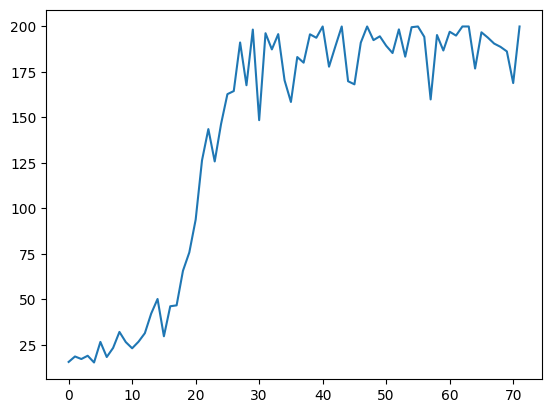

In [26]:
rollouts = 0
steps = 0

ac_model = RL()
lr = 1e-3
optimizer = optim.Adam(ac_model.parameters(), lr=lr)

score_logger = []

while steps < max_steps:
  rewards_log = []
  states_log = []
  log_probs_log = []
  values_log = []

  done = False
  observation = torch.FloatTensor(env.reset()).unsqueeze(0)


  while not done:
    states_log.append(observation)

    dist, value = ac_model(observation)


    action = dist.sample()
    log_prob = dist.log_prob(action.unsqueeze(0))
    log_probs_log.append(log_prob)
    # print(f"{value=}")
    values_log.append(value.squeeze()[action.cpu().item()].reshape(-1,1))

    observation, reward, done, info = env.step(action.cpu().item())
    del info

    observation = torch.FloatTensor(observation).unsqueeze(0)
    # print(observation)

    rewards_log.append(torch.FloatTensor([reward]).unsqueeze(0))

    steps += 1

  states_log.append(observation)

  returns = calc_returns(rewards_log, gamma)
  # Input: A list of N tensors whose shapes are (1,1)
  # Convert the list to a single tensor of (1, N)
  returns = torch.cat(returns, 1)

  values = torch.cat(values_log, 1)
  # Detach because we don't want the agent to backprop to the value function.
  advantages = (returns - values).detach()

  log_probs = torch.cat(log_probs_log, 1)

  action_loss = - (log_probs * advantages).mean()
  # Use MC to update loss for value function.
  critic_loss = (returns - values).pow(2).mean()
  agent_loss = action_loss + critic_loss

  optimizer.zero_grad()
  agent_loss.backward()
  optimizer.step()

  if rollouts % 10 == 0:
    new_lr = max(1e-5, ((max_steps - steps) / max_steps) * lr)
    optimizer.param_groups[0]["lr"] = new_lr

    score_logger.append(np.mean([test_agent(ac_model) for _ in range(10)]))
    clear_output(True)
    plt.plot(score_logger)
    plt.show()

  rollouts += 1

env.close()

# RL's Challenges

1. RL works for some problems, but doesn't work for probably more problems.

2. It needs lots of training data. E.g. OpenAI dota2 uses 10,000 years of game experience.

3. Generalization: If the simulation env is different than real world, which is often the case, the performance in real world is bad.

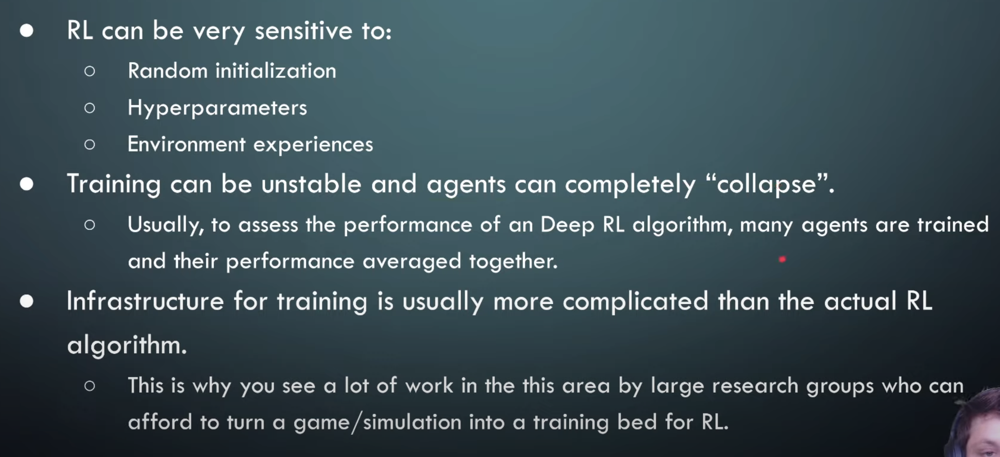

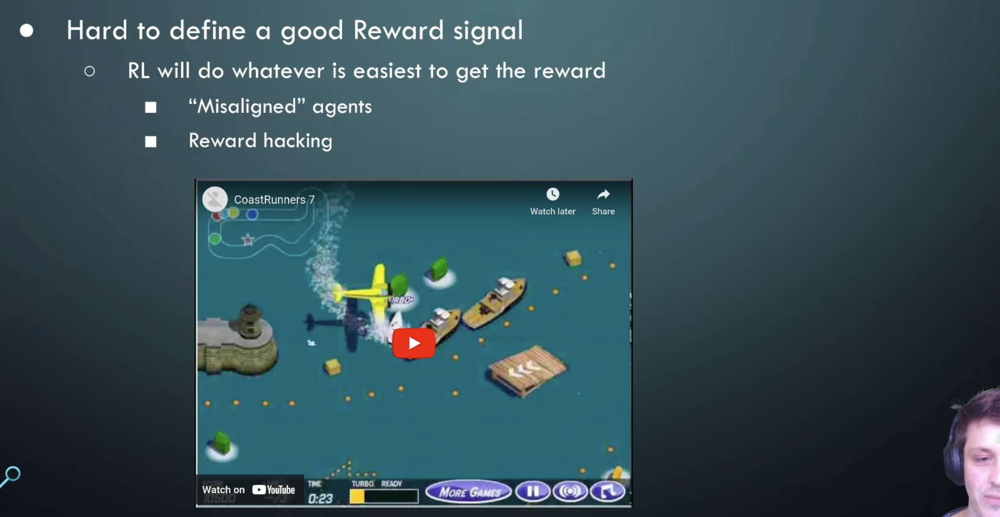

# New Section